# 1. 데이터 로딩

In [1]:
import pandas as pd

# 데이터 로딩
movies_path = '/Users/seoyeongbin/Desktop/ml-latest-small/movies.csv'
ratings_path = '/Users/seoyeongbin/Desktop/ml-latest-small/ratings.csv'

# CSV 파일에서 데이터프레임 생성
movie_df = pd.read_csv(movies_path)
ratings_df = pd.read_csv(ratings_path)

In [2]:
#데이터 확인해보기 - 겹치지 않는 영화 : 9739개
# movieId와 title 칼럼만 확인
print(f"Movie data shape: {movie_df.shape}")

# 첫 몇 행을 확인
print(movie_df.head())

# 영화 제목의 유니크한 개수 확인
print(f"Unique movie titles: {movie_df['title'].nunique()}")

Movie data shape: (9742, 3)
   movieId                               title  \
0        1                    Toy Story (1995)   
1        2                      Jumanji (1995)   
2        3             Grumpier Old Men (1995)   
3        4            Waiting to Exhale (1995)   
4        5  Father of the Bride Part II (1995)   

                                        genres  
0  Adventure|Animation|Children|Comedy|Fantasy  
1                   Adventure|Children|Fantasy  
2                               Comedy|Romance  
3                         Comedy|Drama|Romance  
4                                       Comedy  
Unique movie titles: 9737


# 2. 데이터 전처리-movie_df_clean : 중복 없는 데이터

In [3]:
# 영화 제목의 중복 여부 확인
duplicates = movie_df[movie_df.duplicated(subset='title', keep=False)]

# 중복된 제목 확인
print(f"Number of duplicate movie titles: {duplicates.shape[0]}")
print(duplicates[['movieId', 'title']].sort_values(by='title'))


Number of duplicate movie titles: 10
      movieId                                   title
4169     6003  Confessions of a Dangerous Mind (2002)
9106   144606  Confessions of a Dangerous Mind (2002)
650       838                             Emma (1996)
5601    26958                             Emma (1996)
5854    32600                             Eros (2004)
9135   147002                             Eros (2004)
2141     2851                         Saturn 3 (1980)
9468   168358                         Saturn 3 (1980)
5931    34048                War of the Worlds (2005)
6932    64997                War of the Worlds (2005)


In [4]:
# 중복된 영화 제목 제거 (첫 번째 항목만 남기고 나머지는 삭제)
movie_df_clean = movie_df.drop_duplicates(subset='title', keep='first')

# 중복 제거 후 영화 제목의 개수 확인
print(f"Cleaned movie data shape: {movie_df_clean.shape}")

# 결과 확인
movie_df_clean.head()



Cleaned movie data shape: (9737, 3)


,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy


In [5]:
# 중복된 영화 제목이 없는지 확인
duplicate_titles_clean = movie_df_clean[movie_df_clean.duplicated(subset='title', keep=False)]

# 중복된 제목의 개수 출력
print(f"Number of duplicate movie titles after cleaning: {duplicate_titles_clean.shape[0]}")


Number of duplicate movie titles after cleaning: 0


# 3. 영화 - 영화 행렬 만들기 (동시 시청 유저 기준)

## 3-1 movie_movie_df_clean : 중복없는 영화 -영화 행렬(9737*9737)

In [6]:
import pandas as pd
import numpy as np

# 영화 제목이 중복되지 않도록 정리된 movie_df_clean을 사용
movie_titles_clean = movie_df_clean['title'].tolist()

# ratings_df에서 유저-영화 매트릭스 생성
user_movie_matrix = ratings_df.pivot_table(index='userId', columns='movieId', values='rating', aggfunc='count', fill_value=0)

# 영화-영화 행렬 초기화
num_movies = len(movie_titles_clean)
movie_movie_matrix = np.zeros((num_movies, num_movies), dtype=int)

# 각 영화의 movieId에 해당하는 인덱스를 찾는 딕셔너리
movie_id_to_index_clean = {movie_id: idx for idx, movie_id in enumerate(movie_df_clean['movieId'])}

# 유저-영화 매트릭스에서 두 영화를 동시에 본 유저를 찾고 카운트
for user_id, user_ratings in user_movie_matrix.iterrows():
    # 유저가 본 영화들
    rated_movies = user_ratings[user_ratings > 0].index.tolist()
    
    # 두 영화 모두 본 유저에 대해서만 카운트
    for i in range(len(rated_movies)):
        for j in range(i+1, len(rated_movies)):
            movie_i_id = rated_movies[i]
            movie_j_id = rated_movies[j]
            
            # 두 영화의 ID가 movie_df_clean에 존재하는지 확인
            if movie_i_id in movie_id_to_index_clean and movie_j_id in movie_id_to_index_clean:
                # 두 영화의 인덱스를 얻어 해당 위치의 값 증가
                movie_i_idx = movie_id_to_index_clean[movie_i_id]
                movie_j_idx = movie_id_to_index_clean[movie_j_id]
                
                movie_movie_matrix[movie_i_idx, movie_j_idx] += 1
                movie_movie_matrix[movie_j_idx, movie_i_idx] += 1  # 대칭 행렬이므로 반대 방향도 증가시킴

# 영화 제목을 인덱스와 컬럼으로 사용하여 데이터프레임 생성
movie_movie_df_clean = pd.DataFrame(movie_movie_matrix, index=movie_titles_clean, columns=movie_titles_clean)

# 결과 확인 (영화 제목 기반으로 영화-영화 행렬의 일부)
print(movie_movie_df_clean.head(10))  # 상위 10개 영화만 예시로 출력


                                    Toy Story (1995)  Jumanji (1995)  \
Toy Story (1995)                                   0              68   
Jumanji (1995)                                    68               0   
Grumpier Old Men (1995)                           32              26   
Waiting to Exhale (1995)                           2               3   
Father of the Bride Part II (1995)                32              22   
Heat (1995)                                       58              36   
Sabrina (1995)                                    32              18   
Tom and Huck (1995)                                5               6   
Sudden Death (1995)                               12               3   
GoldenEye (1995)                                  69              56   

                                    Grumpier Old Men (1995)  \
Toy Story (1995)                                         32   
Jumanji (1995)                                           26   
Grumpier Old Men (

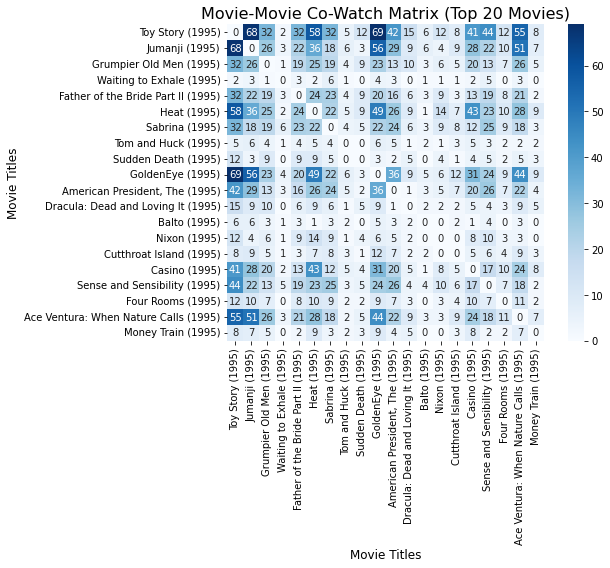

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

# 히트맵을 그리기 전에 행렬 크기가 너무 크면 일부만 시각화
# 예시로 상위 20개 영화만 사용하여 시각화
sample_movie_titles = movie_titles_clean[:20]  # 첫 20개 영화 선택

# 상위 20개 영화에 해당하는 영화-영화 행렬
sample_movie_movie_matrix = movie_movie_df_clean.loc[sample_movie_titles, sample_movie_titles]

# 히트맵 시각화
plt.figure(figsize=(10, 8))
sns.heatmap(sample_movie_movie_matrix, annot=True, fmt='d', cmap='Blues', cbar=True, square=True)
plt.title('Movie-Movie Co-Watch Matrix (Top 20 Movies)', fontsize=16)
plt.xlabel('Movie Titles', fontsize=12)
plt.ylabel('Movie Titles', fontsize=12)
plt.xticks(rotation=90)  # x축 레이블 회전
plt.yticks(rotation=0)  # y축 레이블 회전
plt.tight_layout()

# 시각화 결과 출력
plt.show()

## 3-2 pmi_matrix : movie_movie_df_clean에 pmi 적용

In [8]:
import numpy as np
from tqdm import tqdm  # 진행 상태 표시를 위한 라이브러리

# 영화-영화 행렬에서 PMI 계산 함수
def calculate_pmi(movie_movie_matrix):
    # 각 영화의 총 관람자 수 (행렬에서의 각 영화의 관람 횟수)
    movie_views = movie_movie_matrix.sum(axis=1)
    
    # 총 관람한 유저 수
    total_views = movie_movie_matrix.sum().sum()

    # PMI 행렬 초기화
    pmi_matrix = np.zeros_like(movie_movie_matrix, dtype=float)

    # tqdm을 사용하여 진행 상태 표시
    for i in tqdm(range(movie_movie_matrix.shape[0]), desc="Calculating PMI", unit="movie"):
        for j in range(i+1, movie_movie_matrix.shape[1]):  # 대칭 행렬이므로 반만 계산
            co_occurrence = movie_movie_matrix.iloc[i, j]  # 두 영화가 함께 본 유저 수
            if co_occurrence > 0:
                p_a = movie_views[i] / total_views  # 영화 A의 확률
                p_b = movie_views[j] / total_views  # 영화 B의 확률
                p_ab = co_occurrence / total_views  # 두 영화가 동시에 본 확률

                # PMI 계산
                pmi = np.log(p_ab / (p_a * p_b))
                pmi_matrix[i, j] = pmi
                pmi_matrix[j, i] = pmi  # 대칭 행렬이므로 반대 값도 동일

    return pmi_matrix

# PMI 계산
pmi_matrix = calculate_pmi(movie_movie_df_clean)

# 계산된 PMI 행렬을 확인 (상위 5개 영화만 확인)
print("PMI for top 5 movies:")
print(pmi_matrix[:5, :5])


Calculating PMI: 100%|███████████████████| 9737/9737 [12:02<00:00, 13.48movie/s]

PMI for top 5 movies:
[[0.         0.3672556  0.33028741 0.1570943  0.54343467]
 [0.3672556  0.         0.46900504 0.90891641 0.51509822]
 [0.33028741 0.46900504 0.         0.52710773 1.08529836]
 [0.1570943  0.90891641 0.52710773 0.         1.83886728]
 [0.54343467 0.51509822 1.08529836 1.83886728 0.        ]]


In [9]:
pmi_matrix.shape

(9737, 9737)

In [10]:
import pandas as pd
import numpy as np

# 각 영화가 몇 개의 다른 영화와 연결되었는지 출력
def count_connected_movies(movie_movie_matrix):
    # 연결된 값이 0보다 큰 (즉, 함께 본 유저가 있는) 영화 쌍의 개수를 셈
    connected_counts = np.sum(movie_movie_matrix > 0, axis=1)
    
    # 결과를 데이터프레임으로 만들어서 출력 (영화 제목과 연결된 영화의 개수)
    connected_movies = pd.DataFrame({
        'movie': movie_titles_clean,
        'connected_count': connected_counts
    })
    
    # 연결된 영화가 없는 영화만 필터링
    no_connections = connected_movies[connected_movies['connected_count'] == 0]
    
    # 모든 영화가 연결된 영화 수와 연결이 없는 영화 확인
    print(f"Total movies: {connected_movies.shape[0]}")
    print(f"Movies with no connections: {no_connections.shape[0]}")
    
    # 연결된 영화가 없는 영화들 출력 (영화 제목과 연결된 영화 수)
    print("Movies with no connections:")
    print(no_connections[['movie', 'connected_count']].head(10))  # 상위 10개 영화만 출력
    
    # 각 영화가 연결된 영화 수 출력 (상위 10개만 예시로)
    print("\nMovies with most connections:")
    print(connected_movies.sort_values(by='connected_count', ascending=False).head(10))

# 연결된 영화 개수 계산 및 출력
count_connected_movies(movie_movie_matrix)


Total movies: 9737
Movies with no connections: 18
Movies with no connections:
                                             movie  connected_count
816                          Innocents, The (1961)                0
2211                                Niagara (1953)                0
2499                        For All Mankind (1989)                0
2587  Color of Paradise, The (Rang-e khoda) (1999)                0
3118                I Know Where I'm Going! (1945)                0
4037                            Chosen, The (1981)                0
4506   Road Home, The (Wo de fu qin mu qin) (1999)                0
4598                                Scrooge (1970)                0
4704                                  Proof (1991)                0
5020                     Parallax View, The (1974)                0

Movies with most connections:
                                                  movie  connected_count
314                                 Forrest Gump (1994)             93

In [11]:
# 각 영화별 연결된 영화 개수 출력
import pandas as pd
import numpy as np

# 각 영화가 몇 개의 다른 영화와 연결되었는지 출력 (연결된 영화 개수별로)
def count_connected_movies_by_count(movie_movie_matrix):
    # 연결된 값이 0보다 큰 (즉, 함께 본 유저가 있는) 영화 쌍의 개수를 셈
    connected_counts = np.sum(movie_movie_matrix > 0, axis=1)
    
    # 각 연결된 영화 개수별로 몇 개의 영화가 있는지 집계
    connected_count_summary = pd.Series(connected_counts).value_counts().sort_index()
    
    # 결과 출력: 각 연결된 영화 개수별로 몇 개의 영화가 있는지
    for count, num_movies in connected_count_summary.items():
        print(f"{count} 개 연결된 영화: {num_movies}개")

# 연결된 영화 개수 계산 및 출력
count_connected_movies_by_count(movie_movie_matrix)


0 개 연결된 영화: 18개
20 개 연결된 영화: 5개
21 개 연결된 영화: 4개
22 개 연결된 영화: 2개
23 개 연결된 영화: 3개
24 개 연결된 영화: 1개
25 개 연결된 영화: 4개
26 개 연결된 영화: 6개
27 개 연결된 영화: 3개
28 개 연결된 영화: 3개
29 개 연결된 영화: 3개
30 개 연결된 영화: 3개
31 개 연결된 영화: 1개
32 개 연결된 영화: 3개
33 개 연결된 영화: 3개
35 개 연결된 영화: 4개
36 개 연결된 영화: 2개
37 개 연결된 영화: 1개
38 개 연결된 영화: 12개
40 개 연결된 영화: 7개
42 개 연결된 영화: 1개
43 개 연결된 영화: 4개
44 개 연결된 영화: 1개
45 개 연결된 영화: 6개
46 개 연결된 영화: 5개
47 개 연결된 영화: 1개
48 개 연결된 영화: 1개
50 개 연결된 영화: 3개
53 개 연결된 영화: 5개
55 개 연결된 영화: 2개
56 개 연결된 영화: 1개
57 개 연결된 영화: 4개
60 개 연결된 영화: 2개
61 개 연결된 영화: 2개
63 개 연결된 영화: 9개
65 개 연결된 영화: 3개
69 개 연결된 영화: 2개
70 개 연결된 영화: 1개
71 개 연결된 영화: 1개
72 개 연결된 영화: 1개
73 개 연결된 영화: 1개
74 개 연결된 영화: 2개
75 개 연결된 영화: 3개
80 개 연결된 영화: 4개
81 개 연결된 영화: 1개
82 개 연결된 영화: 8개
83 개 연결된 영화: 1개
84 개 연결된 영화: 3개
85 개 연결된 영화: 2개
86 개 연결된 영화: 2개
88 개 연결된 영화: 1개
92 개 연결된 영화: 4개
93 개 연결된 영화: 1개
94 개 연결된 영화: 3개
99 개 연결된 영화: 5개
100 개 연결된 영화: 1개
101 개 연결된 영화: 1개
102 개 연결된 영화: 6개
105 개 연결된 영화: 1개
106 개 연결된 영화: 3개
111 개 연결된 영화: 11개
112 개 연결된 영화: 2개

3041 개 연결된 영화: 3개
3043 개 연결된 영화: 2개
3044 개 연결된 영화: 4개
3046 개 연결된 영화: 1개
3048 개 연결된 영화: 1개
3049 개 연결된 영화: 1개
3050 개 연결된 영화: 1개
3051 개 연결된 영화: 1개
3054 개 연결된 영화: 1개
3055 개 연결된 영화: 1개
3056 개 연결된 영화: 2개
3058 개 연결된 영화: 2개
3059 개 연결된 영화: 2개
3061 개 연결된 영화: 3개
3062 개 연결된 영화: 1개
3063 개 연결된 영화: 3개
3064 개 연결된 영화: 3개
3065 개 연결된 영화: 2개
3066 개 연결된 영화: 1개
3067 개 연결된 영화: 3개
3069 개 연결된 영화: 1개
3071 개 연결된 영화: 2개
3072 개 연결된 영화: 1개
3073 개 연결된 영화: 4개
3075 개 연결된 영화: 2개
3076 개 연결된 영화: 1개
3077 개 연결된 영화: 1개
3079 개 연결된 영화: 2개
3081 개 연결된 영화: 1개
3085 개 연결된 영화: 1개
3086 개 연결된 영화: 1개
3087 개 연결된 영화: 4개
3088 개 연결된 영화: 2개
3090 개 연결된 영화: 1개
3091 개 연결된 영화: 1개
3094 개 연결된 영화: 1개
3095 개 연결된 영화: 1개
3096 개 연결된 영화: 1개
3097 개 연결된 영화: 1개
3098 개 연결된 영화: 3개
3099 개 연결된 영화: 1개
3101 개 연결된 영화: 2개
3103 개 연결된 영화: 2개
3104 개 연결된 영화: 1개
3107 개 연결된 영화: 4개
3108 개 연결된 영화: 2개
3109 개 연결된 영화: 3개
3110 개 연결된 영화: 2개
3111 개 연결된 영화: 1개
3112 개 연결된 영화: 1개
3113 개 연결된 영화: 4개
3114 개 연결된 영화: 1개
3115 개 연결된 영화: 3개
3116 개 연결된 영화: 3개
3118 개 연결된 영화: 3개
3119 개 연결된

4608 개 연결된 영화: 1개
4610 개 연결된 영화: 2개
4612 개 연결된 영화: 1개
4614 개 연결된 영화: 1개
4616 개 연결된 영화: 1개
4617 개 연결된 영화: 1개
4619 개 연결된 영화: 2개
4621 개 연결된 영화: 2개
4627 개 연결된 영화: 2개
4630 개 연결된 영화: 2개
4631 개 연결된 영화: 1개
4633 개 연결된 영화: 1개
4634 개 연결된 영화: 2개
4636 개 연결된 영화: 1개
4637 개 연결된 영화: 2개
4638 개 연결된 영화: 1개
4639 개 연결된 영화: 2개
4640 개 연결된 영화: 1개
4641 개 연결된 영화: 1개
4642 개 연결된 영화: 2개
4646 개 연결된 영화: 1개
4647 개 연결된 영화: 2개
4648 개 연결된 영화: 1개
4649 개 연결된 영화: 1개
4651 개 연결된 영화: 1개
4653 개 연결된 영화: 1개
4654 개 연결된 영화: 1개
4655 개 연결된 영화: 2개
4656 개 연결된 영화: 1개
4658 개 연결된 영화: 1개
4659 개 연결된 영화: 1개
4661 개 연결된 영화: 2개
4662 개 연결된 영화: 3개
4665 개 연결된 영화: 2개
4667 개 연결된 영화: 2개
4670 개 연결된 영화: 3개
4671 개 연결된 영화: 1개
4676 개 연결된 영화: 2개
4677 개 연결된 영화: 2개
4678 개 연결된 영화: 1개
4679 개 연결된 영화: 1개
4681 개 연결된 영화: 1개
4682 개 연결된 영화: 1개
4685 개 연결된 영화: 2개
4686 개 연결된 영화: 3개
4691 개 연결된 영화: 1개
4692 개 연결된 영화: 1개
4693 개 연결된 영화: 2개
4694 개 연결된 영화: 1개
4695 개 연결된 영화: 2개
4696 개 연결된 영화: 1개
4697 개 연결된 영화: 1개
4699 개 연결된 영화: 1개
4700 개 연결된 영화: 2개
4702 개 연결된 영화: 1개
4704 개 연결된

## 3-3. 연결된 영화 0개인 영화 지우기 : movie_movie_matrix_cleaned ,pmi_matrix_cleaned

In [12]:
import numpy as np
import pandas as pd

# 0개 연결된 영화 찾기
def get_movies_with_no_connections(movie_movie_matrix):
    # 연결된 영화가 하나도 없는 영화 찾기
    connected_counts = np.sum(movie_movie_matrix > 0, axis=1)
    no_connection_movies = np.where(connected_counts == 0)[0]
    return no_connection_movies

# 0개 연결된 영화를 제외한 새로운 영화-영화 행렬 생성
def create_matrix_without_no_connection_movies(movie_movie_matrix):
    # 0개 연결된 영화들의 인덱스 얻기
    no_connection_movies = get_movies_with_no_connections(movie_movie_matrix)
    
    # 0개 연결된 영화 제외한 행렬 생성
    movie_movie_matrix_cleaned = np.delete(movie_movie_matrix, no_connection_movies, axis=0)
    movie_movie_matrix_cleaned = np.delete(movie_movie_matrix_cleaned, no_connection_movies, axis=1)
    
    return movie_movie_matrix_cleaned

# 0개 연결된 영화 제외한 행렬 생성
movie_movie_matrix_cleaned = create_matrix_without_no_connection_movies(movie_movie_matrix)

# 결과 확인: 행렬 크기
print(f"Original movie-movie matrix shape: {movie_movie_matrix.shape}")
print(f"Cleaned movie-movie matrix shape: {movie_movie_matrix_cleaned.shape}")

Original movie-movie matrix shape: (9737, 9737)
Cleaned movie-movie matrix shape: (9719, 9719)


In [13]:
import numpy as np

# 0개 연결된 영화 찾기
def get_movies_with_no_connections(movie_movie_matrix):
    # 연결된 영화가 하나도 없는 영화 찾기
    connected_counts = np.sum(movie_movie_matrix > 0, axis=1)
    no_connection_movies = np.where(connected_counts == 0)[0]
    return no_connection_movies

# 0개 연결된 영화 제외한 새로운 PMI 행렬 생성
def create_pmi_matrix_without_no_connection_movies(pmi_matrix, movie_movie_matrix):
    # 0개 연결된 영화들의 인덱스 얻기
    no_connection_movies = get_movies_with_no_connections(movie_movie_matrix)
    
    # 0개 연결된 영화 제외한 PMI 행렬 생성
    pmi_matrix_cleaned = np.delete(pmi_matrix, no_connection_movies, axis=0)
    pmi_matrix_cleaned = np.delete(pmi_matrix_cleaned, no_connection_movies, axis=1)
    
    return pmi_matrix_cleaned

# 0개 연결된 영화 제외한 PMI 행렬 생성
pmi_matrix_cleaned = create_pmi_matrix_without_no_connection_movies(pmi_matrix, movie_movie_matrix)

# 결과 확인: 행렬 크기
print(f"Original PMI matrix shape: {pmi_matrix.shape}")
print(f"Cleaned PMI matrix shape: {pmi_matrix_cleaned.shape}")

Original PMI matrix shape: (9737, 9737)
Cleaned PMI matrix shape: (9719, 9719)


# 4. 시퀀스 생성하기 : sequences

In [14]:
import numpy as np
import pandas as pd

# 영화 제목 기반으로 시퀀스를 생성하는 함수
def generate_sequences_nearest_w_pmi_titles(pmi_matrix_cleaned, movie_titles, window_size=10):
    sequences = []
    
    # 각 영화 제목에 대해 PMI 값이 큰 상위 w개 영화 찾기
    for movie_idx in range(pmi_matrix_cleaned.shape[0]):
        movie_title = movie_titles[movie_idx]  # 영화 제목
        movie_pmi = pmi_matrix_cleaned[movie_idx]  # 해당 영화와 다른 영화들의 PMI 값
        
        # PMI 값이 큰 순서대로 정렬 (내림차순)
        sorted_movies = np.argsort(movie_pmi)[::-1]  # 내림차순 정렬
        
        # 자기 자신 제외하고 상위 w개 영화 선택
        top_w_movies = sorted_movies[sorted_movies != movie_idx][:window_size]
        
        # 상위 w개 영화 제목 선택
        top_w_movie_titles = [movie_titles[neighbor_idx] for neighbor_idx in top_w_movies]
        
        # 시퀀스에 추가 (영화 제목)
        sequences.append((movie_title, top_w_movie_titles))
    
    return sequences

# 예시로, 상위 10개 제목을 선택하는 시퀀스를 생성
window_size = 10

# 영화 제목 리스트
movie_titles = movie_df['title'].tolist()  # movie_df는 영화 데이터프레임

# 시퀀스 생성
sequences = generate_sequences_nearest_w_pmi_titles(pmi_matrix_cleaned, movie_titles, window_size)

# 결과 확인 (영화 제목 기반으로 시퀀스)
for seq in sequences:
    print(f"Movie '{seq[0]}' - Nearest Neighbors: {', '.join(seq[1])}")

Movie 'Toy Story (1995)' - Nearest Neighbors: Once Upon a Time... When We Were Colored (1995), Thin Line Between Love and Hate, A (1996), The True Memoirs of an International Assassin (2016), Turbo Kid (2015), Oz the Great and Powerful (2013), Mina Tannenbaum (1994), For the Birds (2000), Man of the Year (1995), Avengers: Infinity War - Part I (2018), Sunset Park (1996)
Movie 'Jumanji (1995)' - Nearest Neighbors: Furious 7 (2015), New York, New York (1977), Girl Walks Home Alone at Night, A (2014), Beyond Bedlam (1993), Frisk (1995), Castle Freak (1995), Relative Fear (1994), Young Poisoner's Handbook, The (1995), Sommersby (1993), Saving Private Ryan (1998)
Movie 'Grumpier Old Men (1995)' - Nearest Neighbors: Thin Line Between Love and Hate, A (1996), Paradise (1982), This Boy's Life (1993), Sunset Park (1996), 1-900 (06) (1994), Cry, the Beloved Country (1995), Mina Tannenbaum (1994), Streetcar Named Desire, A (1951), Fools Rush In (1997), Unforgettable (1996)
Movie 'Waiting to Exhal

Movie 'Here on Earth (2000)' - Nearest Neighbors: Normal Life (1996), Being John Malkovich (1999), Lock, Stock & Two Smoking Barrels (1998), Fitzcarraldo (1982), Contact (1997), In the Realm of the Senses (Ai no corrida) (1976), Whole Nine Yards, The (2000), Walking and Talking (1996), Hard Day's Night, A (1964), Great Day in Harlem, A (1994)
Movie 'Whatever It Takes (2000)' - Nearest Neighbors: Game 6 (2005), Fever Pitch (2005), Paper Clips (2004), MatchMaker, The (1997), Night Porter, The (Portiere di notte, Il) (1974), Artemisia (1997), Return of Martin Guerre, The (Retour de Martin Guerre, Le) (1982), Janie Jones (2010), Only Angels Have Wings (1939), Crossing Delancey (1988)
Movie 'Buddy Boy (1999)' - Nearest Neighbors: Send Me No Flowers (1964), Annie Get Your Gun (1950), MatchMaker, The (1997), Night Porter, The (Portiere di notte, Il) (1974), Willard (2003), How to Succeed in Business Without Really Trying (1967), Artemisia (1997), Better Tomorrow II, A (Ying hung boon sik II) 

Movie 'Tightrope (1984)' - Nearest Neighbors: Bootleggers (1961), The Electric Hotel (1908), Spy (2015), Alien: Covenant (2017), Tom and Jerry: A Nutcracker Tale (2007), Loved Ones, The (2009), The Duke of Burgundy (2014), Patton Oswalt: My Weakness Is Strong (2009), Invisible Man Returns, The (1940), Too Many Cooks (2014)
Movie 'Sleeping with the Enemy (1991)' - Nearest Neighbors: B. Monkey (1998), Hello Again (1987), Rosetta (1999), Licence to Kill (1989), Frankenstein (1931), What Dreams May Come (1998), Heaven (2002), Faces of Death 3 (1985), Brother (2000), Body Parts (1991)
Movie 'PCU (1994)' - Nearest Neighbors: Justice League (2017), Blob, The (1958), Insidious: The Last Key (2018), Isle of Dogs (2018), The Commuter (2018), Bright (2017), I Know Where I'm Going! (1945), Phir Hera Pheri (2006), The Crew (2016), Dreamer: Inspired by a True Story (2005)
Movie 'Rookie, The (1990)' - Nearest Neighbors: Elling (2001), Before Sunset (2004), Robots (2005), Golden Door (Nuovomondo) (200

Movie '9to5: Days in Porn (a.k.a. 9 to 5: Days in Porn) (2008)' - Nearest Neighbors: Snitch (2013), Ghost Dad (1990), Into the Abyss (2011), Beasts of the Southern Wild (2012), Red (2010), Asterix & Obelix: God Save Britannia (Astérix et Obélix: Au service de Sa Majesté) (2012), Man Who Came to Dinner, The (1942), A Walk in the Woods (2015), The Second Renaissance Part II (2003), Omega Doom (1996)
Movie 'Humpday (2009)' - Nearest Neighbors: Change-Up, The (2011), Asphyx, The (1973), Star Is Born, A (1954), Voices from the List (2004), Man Who Knew Too Much, The (1934), Seven Pounds (2008), Step Brothers (2008), Sound of the Mountain (Thunder of the Mountain, The) (Yama no oto) (1954), Princess (Prinsessa) (2010), Mother (Madeo) (2009)
Movie 'Polytechnique (2009)' - Nearest Neighbors: Split (2017), Lynne Koplitz: Hormonal Beast (2017), 10th & Wolf (2006), San Francisco (1936), The Edge of Seventeen (2016), Wonder (2017), Jim Norton: American Degenerate (2013), Memories (Memorîzu) (1995)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [15]:
sequences

[('Toy Story (1995)',
  ['Once Upon a Time... When We Were Colored (1995)',
   'Thin Line Between Love and Hate, A (1996)',
   'The True Memoirs of an International Assassin (2016)',
   'Turbo Kid (2015)',
   'Oz the Great and Powerful (2013)',
   'Mina Tannenbaum (1994)',
   'For the Birds (2000)',
   'Man of the Year (1995)',
   'Avengers: Infinity War - Part I (2018)',
   'Sunset Park (1996)']),
 ('Jumanji (1995)',
  ['Furious 7 (2015)',
   'New York, New York (1977)',
   'Girl Walks Home Alone at Night, A (2014)',
   'Beyond Bedlam (1993)',
   'Frisk (1995)',
   'Castle Freak (1995)',
   'Relative Fear (1994)',
   "Young Poisoner's Handbook, The (1995)",
   'Sommersby (1993)',
   'Saving Private Ryan (1998)']),
 ('Grumpier Old Men (1995)',
  ['Thin Line Between Love and Hate, A (1996)',
   'Paradise (1982)',
   "This Boy's Life (1993)",
   'Sunset Park (1996)',
   '1-900 (06) (1994)',
   'Cry, the Beloved Country (1995)',
   'Mina Tannenbaum (1994)',
   'Streetcar Named Desire, A (

In [16]:
# 시퀀스 개수 확인
print(f"Total sequences generated: {len(sequences)}")

Total sequences generated: 9719


In [17]:
# movie_movie_matrix_cleaned의 크기를 확인하고, 해당 인덱스에 맞는 영화 제목만 추출
movie_titles_cleaned = [movie_titles[i] for i in range(len(movie_titles)) if i < movie_movie_matrix_cleaned.shape[0]]

# 결과 확인
print(f"Number of cleaned movie titles: {len(movie_titles_cleaned)}")
print(f"First 5 cleaned movie titles: {movie_titles_cleaned[:5]}")

Number of cleaned movie titles: 9719
First 5 cleaned movie titles: ['Toy Story (1995)', 'Jumanji (1995)', 'Grumpier Old Men (1995)', 'Waiting to Exhale (1995)', 'Father of the Bride Part II (1995)']


In [18]:
import pandas as pd

# movie_titles_cleaned를 DataFrame으로 변환
movie_titles_cleaned_df = pd.DataFrame(movie_titles_cleaned, columns=['title'])

# movie_titles_cleaned_df를 인덱스와 제목으로 구성된 새로운 DataFrame
movie_titles_cleaned_df['index'] = movie_titles_cleaned_df.index

# 결과 확인
print(movie_titles_cleaned_df.head())


                                title  index
0                    Toy Story (1995)      0
1                      Jumanji (1995)      1
2             Grumpier Old Men (1995)      2
3            Waiting to Exhale (1995)      3
4  Father of the Bride Part II (1995)      4


In [19]:
print(len(movie_titles_cleaned_df))

9719


# 5. skip-gram 학습

In [20]:
# 영화 제목을 표준화하는 함수
def preprocess_movie_title(title):
    return title.strip().replace('(', '').replace(')', '').replace(' ', '_')

# 1. 각 시퀀스를 단어 리스트로 변환
# `sequences`는 (영화 제목, [상위 w개 영화 제목들]) 형태로 변환
sequences_for_training = []
for movie_title, top_w_movie_titles in sequences:
    # 영화 제목을 표준화하여 단어 리스트로 변환
    processed_movie_title = preprocess_movie_title(movie_title)
    processed_top_w_movie_titles = [preprocess_movie_title(title) for title in top_w_movie_titles]
    
    # [중심 영화] + [주변 영화들] 형태로 변환
    sequences_for_training.append([processed_movie_title] + processed_top_w_movie_titles)


In [21]:
from gensim.models import Word2Vec

# 영화 제목을 표준화하는 함수
def preprocess_movie_title(title):
    return title.strip().replace('(', '').replace(')', '').replace(' ', '_')

# 1. 각 시퀀스를 단어 리스트로 변환
# `sequences`는 (영화 제목, [상위 w개 영화 제목들]) 형태로 변환
sequences_for_training = []
for movie_title, top_w_movie_titles in sequences:
    # 영화 제목을 표준화하여 단어 리스트로 변환
    processed_movie_title = preprocess_movie_title(movie_title)
    processed_top_w_movie_titles = [preprocess_movie_title(title) for title in top_w_movie_titles]
    
    # [중심 영화] + [주변 영화들] 형태로 변환
    sequences_for_training.append([processed_movie_title] + processed_top_w_movie_titles)

# 2. Word2Vec 모델 학습
skipgram_model = Word2Vec(sentences=sequences_for_training, 
                           vector_size=100,   # 임베딩 차원
                           window=5,          # 주변 단어 범위
                           min_count=1,       # 최소 등장 횟수
                           sg=1,              # Skip-gram 방식 사용
                           workers=4)         # 학습에 사용할 CPU 코어 수

# 3. 학습된 모델에서 특정 영화 임베딩 추출 함수
def get_movie_embedding(model, movie_title):
    # 영화 제목을 표준화한 후 모델에서 임베딩 추출
    standardized_title = preprocess_movie_title(movie_title)
    if standardized_title in model.wv:
        return model.wv[standardized_title]
    else:
        print(f"'{movie_title}' not found in the model.")
        return None

# 4. 모든 영화에 대해 임베딩 추출 및 출력
for movie_title in movie_titles:
    embedding = get_movie_embedding(skipgram_model, movie_title)
    
    if embedding is not None:
        print(f"Embedding for '{movie_title}':")
        print(embedding)

Embedding for 'Toy Story (1995)':
[-0.024274    0.05450531 -0.0309151   0.05608698  0.0092093  -0.07901985
 -0.03323912  0.07658526 -0.04000135 -0.03882265  0.00595961  0.01059047
 -0.02424277  0.00900616  0.01186064  0.01042018 -0.00729152 -0.01953872
  0.01023531 -0.01685121 -0.05159139  0.03324615  0.03973072  0.00975033
  0.01026096 -0.00142015 -0.04797275  0.01141161 -0.02199825  0.00753543
 -0.031212   -0.01158451  0.01321902 -0.04249692  0.00721222  0.02988448
 -0.02834591 -0.05723197  0.00038799 -0.02300948 -0.02270115 -0.06885546
 -0.02728644 -0.02601018  0.03396364  0.01099463  0.01568885 -0.01847578
  0.01403365  0.03965234  0.02015349  0.00474569 -0.02281368 -0.04831735
 -0.02477819 -0.01053857 -0.0085898  -0.01024817 -0.05384788  0.03158345
  0.01269267  0.02939359 -0.04006801 -0.02333557  0.02387688 -0.00909034
  0.02034768  0.00109456 -0.02665525  0.05730472 -0.04325369  0.01199046
 -0.01526526 -0.04127423  0.02775762  0.02653157  0.00712613 -0.01989398
 -0.02654124  0.0

Embedding for 'House of the Spirits, The (1993)':
[-5.66890836e-02  2.28634864e-01 -9.44931731e-02  2.10161060e-01
  8.18260387e-03 -2.90831536e-01 -6.93680495e-02  2.75366426e-01
 -1.57065555e-01 -1.20084614e-01  1.34886866e-02 -2.24637683e-04
 -4.18955907e-02  2.55450159e-02  5.66548966e-02  3.67717706e-02
  1.31334811e-02 -8.33684057e-02  1.22365849e-02 -9.19682831e-02
 -2.17323229e-01  1.08675435e-01  7.65578300e-02  1.73675213e-02
 -1.60824123e-03  1.13372533e-02 -1.62550002e-01  6.65604835e-03
 -3.39579023e-02  2.14041863e-02 -4.31741178e-02 -3.30904461e-02
  7.32163563e-02 -1.37656868e-01  1.02417842e-02  1.33040741e-01
 -9.00881812e-02 -2.13438809e-01  5.68851009e-02 -1.07122473e-01
 -5.64382486e-02 -1.84241354e-01 -6.24220408e-02 -1.17569268e-01
  1.12806313e-01  4.25125584e-02  3.67702171e-02 -6.64522499e-02
  3.98287438e-02  1.53493837e-01  4.33066897e-02 -3.58267990e-03
 -5.23198768e-02 -1.48822963e-01 -7.87826031e-02 -6.02860712e-02
  6.72571314e-03  1.14570754e-02 -1.3603

  0.05076415 -0.06241362 -0.03099066  0.00093562]
Embedding for 'Gay Divorcee, The (1934)':
[-0.01635252  0.12026014 -0.09570803  0.10611995  0.02253204 -0.1858945
 -0.04483599  0.144683   -0.09435635 -0.07066678 -0.00753695  0.02504435
 -0.0440198   0.03806957  0.00238443  0.02774206 -0.01306209 -0.04720267
  0.00233516 -0.05488954 -0.10551602  0.08314259  0.05932865  0.00333005
  0.02692319 -0.00373778 -0.08817288  0.02195269 -0.03834269  0.02942585
 -0.04849845 -0.02014304  0.04866863 -0.09723361  0.00513366  0.0705414
 -0.05786806 -0.1429261   0.01120426 -0.05520692 -0.04337692 -0.14475368
 -0.03706523 -0.06963922  0.07087712  0.01553412  0.06978402 -0.04175712
  0.03448711  0.09679691  0.04763727 -0.00259362 -0.03984005 -0.1125598
 -0.06007181 -0.05441501  0.01200274  0.00035463 -0.08841795  0.05585292
  0.05191537  0.04490695 -0.06931043 -0.04190297  0.03888984 -0.01082165
  0.03829346 -0.00567679 -0.09524117  0.10111403 -0.08469007  0.02886382
 -0.02461429 -0.07250093  0.0734754

  0.09955925 -0.082224   -0.08205971 -0.02819097]
Embedding for 'Nosferatu (Nosferatu, eine Symphonie des Grauens) (1922)':
[-0.01332204  0.290268   -0.02648701  0.18540254  0.03373753 -0.2766417
 -0.11770014  0.42828012 -0.19918545 -0.14626168 -0.05559378 -0.02665621
 -0.00287257  0.06917521  0.16247764  0.09852861  0.0240415  -0.00205374
  0.02079954 -0.09263768 -0.1605423   0.08571411  0.19334614  0.05301843
  0.01685998 -0.01281469 -0.26503906  0.05662993 -0.17997065  0.02941708
 -0.02422095 -0.11779667  0.13691108 -0.277618    0.0469029   0.0619247
 -0.18063775 -0.2584589   0.02288527 -0.10574407 -0.0913335  -0.19263153
 -0.19584788 -0.10577294  0.25551894  0.07215025  0.01378269 -0.00862511
 -0.06087428  0.24122666  0.08813626 -0.02599795 -0.07362741 -0.13269559
 -0.1857409  -0.03119001  0.07386211  0.10466456 -0.14849406 -0.03045643
  0.08033285  0.07143828 -0.19204088 -0.0178396   0.10475638  0.02453863
  0.0697895   0.00884333 -0.24168152  0.19830443 -0.112804    0.1463531
  0

  0.8204581  -0.03447472  0.13569598  0.10231438]
Embedding for 'Barney's Great Adventure (1998)':
[-0.00914291  0.07421275 -0.02075155  0.07074706  0.00432603 -0.06577121
 -0.02122831  0.08494062 -0.06433484 -0.02332407 -0.01451782 -0.01129211
  0.01249908  0.02224049 -0.00210674  0.01653114 -0.00994399  0.00087137
 -0.0049363  -0.01361082 -0.04986313  0.04388655 -0.00016169 -0.00157631
 -0.00898089  0.03529426 -0.04496814 -0.02957155  0.02062933  0.02795239
 -0.05019796 -0.01515654  0.03006222 -0.02004323  0.00869488  0.05101594
 -0.03309038 -0.04939751 -0.0115325  -0.06407998 -0.01163243 -0.06978769
  0.01230468 -0.02977394  0.04800212  0.0127932   0.00264798 -0.02978821
  0.02372635  0.02056574 -0.00244916 -0.00682067  0.00303187 -0.04832578
 -0.00723717 -0.03548222 -0.00901747  0.00620339 -0.04224154  0.01278491
  0.01739295  0.0060515  -0.02606831 -0.01436489  0.01977808  0.008976
 -0.01331646 -0.01296392 -0.03524369  0.0504473  -0.03564741  0.01338438
 -0.02762184 -0.03575164  0

Embedding for 'Sabotage (1936)':
[-4.89355177e-02  1.76591232e-01 -5.16876467e-02  1.90787628e-01
  9.81712490e-02 -2.80120701e-01 -2.10579142e-01  2.69924849e-01
 -1.13935880e-01 -1.41637430e-01  1.87181775e-02 -1.01000801e-01
  3.08926124e-02  1.24593601e-01  1.23935575e-02  1.43801779e-01
 -7.48807639e-02 -1.05583385e-01  2.29613319e-01  1.04779694e-02
 -2.20962524e-01  2.53417224e-01 -2.99069076e-03  1.42636761e-01
  1.32580131e-01 -1.31424353e-01 -2.45790422e-01 -2.66692899e-02
 -1.43634990e-01 -3.22959870e-02 -1.36647910e-01 -6.18486479e-02
  2.05066457e-01 -1.75502419e-01 -8.45659375e-02  2.54139245e-01
 -2.22416028e-01 -1.97542757e-01 -4.82568815e-02 -3.79440859e-02
 -1.75267458e-01 -3.22454393e-01 -5.04851341e-02 -9.09875184e-02
  1.10362418e-01 -2.75311898e-02  4.05258685e-02 -8.94689411e-02
 -4.60702868e-04  2.33937413e-01  1.68349639e-01  2.75338162e-02
 -1.07388951e-01 -1.93301171e-01 -3.40631753e-02 -7.26953000e-02
  1.06055513e-01  4.68784682e-02 -1.85867250e-01  3.26626

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.01315332  0.08681328 -0.01758904  0.06620354  0.0025927  -0.09398667
 -0.01952559  0.0740335  -0.07890572 -0.02775209  0.00531181 -0.00111792
  0.00624176  0.01764769 -0.00123988  0.03146492 -0.00861626  0.00667999
  0.00025214 -0.02342567 -0.05308563  0.04453482 -0.01094899 -0.0185159
 -0.029434    0.03604965 -0.04255136 -0.04050305  0.01256051  0.04875054
 -0.05547215 -0.01512348  0.03510147 -0.01840672 -0.00053494  0.06363607
 -0.03506123 -0.06069843 -0.00982312 -0.08513095 -0.01372868 -0.07873467
  0.01876154 -0.03830974  0.04772111  0.0168118   0.01426278 -0.02192075
  0.04731778  0.02327225 -0.00854627 -0.01268284  0.00059859 -0.06353393
 -0.02250794 -0.04872441 -0.01172517  0.00986619 -0.06284799  0.01256699
  0.00383122  0.02277407 -0.04446345 -0.03549798 -0.01097988  0.01491473
 -0.00547453  0.00012325 -0.04873682  0.07309961 -0.03185642  0.00477661
 -0.03300368 -0.05064622  0.02649033  0.03474474  0.02538858 -0.02533614
 -0.05594597 -0.00416683  0.09229959  0.00396667 -0.

  0.0610539  -0.03241717 -0.04104275 -0.00807244]
Embedding for 'Merchant of Venice, The (2004)':
[-0.03862457  0.20405626 -0.06221144  0.13005139  0.03267101 -0.28291452
 -0.08384157  0.24471684 -0.11155024 -0.08739983  0.01585781 -0.00681153
 -0.03282947  0.04828407  0.03119829  0.07037587  0.02244925 -0.08507925
  0.03947158 -0.07259168 -0.14441405  0.09923608  0.09195381  0.0013979
  0.04469981 -0.01023196 -0.14030659  0.00579669 -0.07776082  0.04746152
 -0.06995682 -0.03119534  0.1061819  -0.13276593  0.018132    0.11993144
 -0.07086959 -0.18756612  0.00564528 -0.11074363 -0.09088033 -0.15634625
 -0.0702801  -0.09108184  0.10201986 -0.0033726   0.01710602 -0.06349624
  0.03736768  0.12399393  0.02721026  0.00055544 -0.05931218 -0.15581171
 -0.08013801 -0.04815244  0.03262838  0.00327825 -0.14018407  0.05386909
  0.06687596  0.04926334 -0.12220354 -0.02873436  0.03565487 -0.00388268
  0.02753071 -0.03244257 -0.14138804  0.15872431 -0.11784776  0.0286564
 -0.02506804 -0.09859549  0.

  1.29376963e-01 -1.23081602e-01 -5.79766929e-02 -9.86879691e-03]
Embedding for 'Producers, The (2005)':
[-0.00248913  0.059261   -0.03707552  0.0822921   0.01049516 -0.11100502
 -0.03485998  0.08816157 -0.0433609  -0.04361343 -0.00196145  0.01015799
 -0.01817554  0.00900919  0.00229038  0.03558659 -0.01663549 -0.04438558
 -0.00420335 -0.01113655 -0.0753808   0.05787273  0.0325445   0.00229097
  0.024509   -0.00208906 -0.05458415 -0.00150033 -0.01270975  0.02122981
 -0.03695836  0.00519805  0.0204022  -0.04236089  0.01061087  0.05224816
 -0.01509676 -0.08279472  0.01448255 -0.04792909 -0.02867794 -0.0850187
 -0.00455034 -0.0404538   0.03179754  0.00649978  0.04072534 -0.02111887
  0.0368334   0.05628282  0.0197551   0.00793591 -0.01239847 -0.06238187
 -0.02190476 -0.03614509  0.00594029 -0.00192141 -0.05097856  0.02800475
  0.0314392   0.01317761 -0.03840804 -0.01497721  0.02484922 -0.00710674
  0.01929806  0.00527483 -0.04543526  0.07543539 -0.03403809  0.0064879
 -0.00208381 -0.05521

  3.51608135e-02 -3.22446376e-02 -1.92495733e-02 -1.27015985e-04]
Embedding for 'After the Wedding (Efter brylluppet) (2006)':
[-0.00906702  0.05565275 -0.04980788  0.03904127  0.00841751 -0.09144045
 -0.01852994  0.04827988 -0.02770877 -0.03422757  0.00503463 -0.00274709
 -0.02131144  0.00145976  0.01400392  0.03289747 -0.00395019 -0.03183418
 -0.00282085 -0.00697066 -0.03999042  0.04856187  0.01859295  0.01661163
  0.00852006 -0.01152733 -0.04992913 -0.00706629 -0.02123871  0.02578039
 -0.01891197 -0.01122101  0.01026193 -0.02440246 -0.00126859  0.04461028
 -0.00408101 -0.07032484  0.00230769 -0.03171022 -0.01556417 -0.05263644
 -0.00255549 -0.03446807  0.02952089 -0.00619869  0.02765699 -0.01327472
  0.01371669  0.01944819  0.01516601  0.00832271  0.00438698 -0.04749496
 -0.01943415 -0.03312542 -0.00315643 -0.00060568 -0.0536565   0.01908876
  0.01722634  0.02260149 -0.04088266 -0.01459645  0.01793061 -0.02034597
  0.01297017  0.01333528 -0.03433474  0.04628076 -0.02941085  0.003179

  6.7189619e-02 -3.2983009e-02 -4.2984720e-02 -2.3965409e-02]
Embedding for 'Nim's Island (2008)':
[-0.49939784  0.68333703  0.01203905  0.54409075  0.20755206 -1.1749241
  0.02962731  0.41078624 -0.16068763 -0.3797716  -0.17047256  0.11139391
 -0.11620979 -0.22786133 -0.22412719  0.362651   -0.3598739  -0.69444406
 -0.17738956  0.18198954  0.05495756  0.09125339  0.1550781  -0.21495377
  0.02887626  0.07220911 -0.33924937 -0.2718059   0.28704256  0.42344385
 -0.6832382   0.3290038   0.3369838  -0.22407436 -0.15320392  0.26679042
  0.26351902 -0.48522204 -0.26187047 -0.14348975 -0.5567089  -0.5010565
  0.18565558 -0.60498935 -0.3685976  -0.1595828   0.337977   -0.44898826
  0.26084068  0.41178817 -0.1400715  -0.1891211  -0.16064025 -0.24973206
 -0.2663159   0.1876638  -0.438691   -0.36521938 -0.5665632  -0.00168689
  0.3972857   0.29849955 -0.507498   -0.542231    0.06023752 -0.5284949
  0.2741261  -0.42793703 -0.18485366  0.7392006  -0.20420946  0.15782766
 -0.15752697 -0.24628705  0.

  0.21297592  0.02747544 -0.527367   -0.09090572]
Embedding for 'Limits of Control, The (2009)':
[-5.75443096e-02  2.55182147e-01 -1.11926936e-01  1.65464327e-01
  5.80551997e-02 -4.06829029e-01 -1.66020483e-01  4.16047901e-01
 -1.96007907e-01 -1.21111244e-01 -1.22556753e-01  3.26157286e-04
 -4.66560125e-02  9.23302397e-02  1.15448922e-01  8.21087584e-02
  1.16026364e-02 -2.55636517e-02  8.63154456e-02 -1.40332013e-01
 -1.64923728e-01  1.73573032e-01  1.17655262e-01  1.75510477e-02
  5.99099062e-02 -2.94202361e-02 -2.23429844e-01  3.41339633e-02
 -9.22320187e-02 -1.65861677e-02 -3.97718959e-02 -6.47946298e-02
  1.86573848e-01 -1.78795859e-01  7.02740327e-02  1.32462263e-01
 -1.63910031e-01 -3.01292032e-01  9.16829482e-02 -1.52221084e-01
 -1.03186488e-01 -1.67506337e-01 -1.15306586e-01 -1.46422669e-01
  2.06371263e-01  4.83727735e-03  6.54901192e-02 -2.81741396e-02
 -2.21612882e-02  2.41142854e-01  6.38395771e-02  3.20934355e-02
 -1.14944905e-01 -1.79240286e-01 -1.54784456e-01 -6.182048

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [22]:
# movie_titles_cleaned의 제목을 기준으로 임베딩되지 않은 영화 찾기
missing_movies = []
for title in movie_titles_cleaned:
    standardized_title = preprocess_movie_title(title)
    if standardized_title not in skipgram_model.wv:
        missing_movies.append(title)

# 누락된 영화 개수 출력
print(f"Number of missing movies: {len(missing_movies)}")

# 누락된 영화 제목 출력 (원한다면 일부 출력)
print(f"Missing movies: {missing_movies[:10]}")  # 첫 10개만 출력

Number of missing movies: 0
Missing movies: []


In [23]:
# 1. 각 영화의 임베딩을 뽑아서 출력
for movie_title in movie_titles_cleaned:
    embedding = get_movie_embedding(skipgram_model, movie_title)
    
    if embedding is not None:
        print(f"Embedding for '{movie_title}':")
        print(embedding)
        print("-" * 50)  # 구분선

# 2. 만약 너무 많아서 일부만 확인하고 싶다면 첫 10개 영화만 출력:
for movie_title in movie_titles_cleaned[:10]:
    embedding = get_movie_embedding(skipgram_model, movie_title)
    
    if embedding is not None:
        print(f"Embedding for '{movie_title}':")
        print(embedding)
        print("-" * 50)

Embedding for 'Toy Story (1995)':
[-0.024274    0.05450531 -0.0309151   0.05608698  0.0092093  -0.07901985
 -0.03323912  0.07658526 -0.04000135 -0.03882265  0.00595961  0.01059047
 -0.02424277  0.00900616  0.01186064  0.01042018 -0.00729152 -0.01953872
  0.01023531 -0.01685121 -0.05159139  0.03324615  0.03973072  0.00975033
  0.01026096 -0.00142015 -0.04797275  0.01141161 -0.02199825  0.00753543
 -0.031212   -0.01158451  0.01321902 -0.04249692  0.00721222  0.02988448
 -0.02834591 -0.05723197  0.00038799 -0.02300948 -0.02270115 -0.06885546
 -0.02728644 -0.02601018  0.03396364  0.01099463  0.01568885 -0.01847578
  0.01403365  0.03965234  0.02015349  0.00474569 -0.02281368 -0.04831735
 -0.02477819 -0.01053857 -0.0085898  -0.01024817 -0.05384788  0.03158345
  0.01269267  0.02939359 -0.04006801 -0.02333557  0.02387688 -0.00909034
  0.02034768  0.00109456 -0.02665525  0.05730472 -0.04325369  0.01199046
 -0.01526526 -0.04127423  0.02775762  0.02653157  0.00712613 -0.01989398
 -0.02654124  0.0

  0.21609125 -0.15687355 -0.09080706 -0.02826225]
--------------------------------------------------
Embedding for 'I Like It Like That (1994)':
[-0.16484386  0.57167876  0.17656034  1.0523438   0.12520707 -0.57644093
  0.02672384  0.8696374  -0.23999374 -0.25441623 -0.21526091  0.07616866
 -0.45195198  0.359172    0.16533343 -0.13566448  0.0628551  -0.0779999
  0.08972697 -0.40087697 -0.9341233   0.17765142  0.16013199  0.5256117
 -0.19423026 -0.24026994 -0.28911966  0.24412031 -0.0349864  -0.07830096
 -0.41114163  0.3458514   0.40491298 -0.9908915   0.13835907 -0.40490374
 -0.13914323 -0.5110208   0.48835054 -0.151045   -0.1571811  -0.02051371
 -0.44430992 -0.8441318   0.5467144   0.61022234  0.5139471   0.00552449
 -0.07911591  0.68675363  0.32545245  0.49254793 -0.3106647  -0.3847457
 -0.63702166 -0.7656736  -0.31550723  0.65845436 -0.40562055  0.40300924
  0.26640865 -0.2964413  -0.04903604  0.01203251 -0.07580215 -0.39694467
  0.25273776 -0.18541718 -0.2852416   0.5052558   0.270

  0.10657747 -0.05223044 -0.04082206 -0.00691318]
--------------------------------------------------
Embedding for 'Thinner (1996)':
[-0.04364447  0.13007142 -0.1103249   0.13223346  0.0119289  -0.14435306
 -0.04214594  0.12651342 -0.11716805 -0.08512171  0.01126569  0.02666619
 -0.02861506  0.05149736 -0.00482368  0.03151861 -0.01097867 -0.0386716
  0.00907141 -0.03658506 -0.08809225  0.08004249  0.08979037  0.00233623
  0.04641748  0.04544813 -0.08334179  0.05798599 -0.01159276  0.03453701
 -0.05459515 -0.00634961  0.05386078 -0.10831666  0.00830943  0.0565661
 -0.02299328 -0.10250705  0.01656634 -0.01814396 -0.01739506 -0.15849248
 -0.03673997 -0.0605606   0.05948777  0.02510639  0.04522186 -0.0436112
  0.02237805  0.08275342  0.03802708  0.01287024 -0.05100488 -0.11748996
 -0.03481079 -0.02759232 -0.01192932 -0.03310234 -0.09786426  0.05209367
  0.03467463  0.06001111 -0.05396063 -0.04829912  0.05788824  0.00606685
  0.01994767  0.01421931 -0.07401339  0.11058781 -0.10178579  0.041

  0.05785781 -0.01165196 -0.04061005 -0.0080329 ]
--------------------------------------------------
Embedding for 'Sleeper (1973)':
[-2.62526125e-02  6.35593757e-02 -2.43623294e-02  8.24878886e-02
  2.11741566e-03 -1.04462869e-01  1.58296828e-03  6.78688064e-02
 -3.53795998e-02 -1.78066585e-02  5.84645243e-03  2.03452930e-02
 -3.20303440e-02  2.02452838e-02  9.14645568e-03  2.26539224e-02
  1.45895185e-03 -2.03509461e-02  2.00987812e-02 -9.41139151e-05
 -6.61928728e-02  7.70166889e-02  1.32779572e-02 -1.04478681e-02
  2.23938487e-02  1.49733815e-02 -5.68285100e-02  8.94873962e-03
 -2.69714538e-02  1.26277693e-02 -4.32779714e-02 -2.09197924e-02
  2.06322260e-02 -2.30107494e-02 -7.98797421e-03  5.33739179e-02
 -1.66051295e-02 -6.36427552e-02  1.72663648e-02 -4.06408822e-03
 -2.99308803e-02 -7.95767158e-02 -6.19493332e-03 -4.19513844e-02
  4.99425568e-02 -5.07757533e-03  1.62751731e-02 -5.05614281e-02
  3.78893577e-02  1.60665568e-02  3.30725275e-02  1.69554893e-02
  5.87940309e-03 -4.86

--------------------------------------------------
Embedding for 'Benny & Joon (1993)':
[-0.03423949  0.22292218 -0.14870341  0.20426892  0.03261345 -0.3066437
 -0.09041315  0.27257442 -0.173146   -0.13117528 -0.02358039  0.02381808
 -0.04270593  0.06729183  0.02437639  0.04801746  0.016759   -0.08615308
  0.01391652 -0.08514474 -0.18799905  0.12166471  0.09195248  0.04466837
  0.04080839 -0.01509798 -0.18401936  0.04709126 -0.07483134  0.04890507
 -0.09875697 -0.0518722   0.08089261 -0.1811895   0.00300215  0.11500398
 -0.10408572 -0.24334721  0.0267118  -0.11228317 -0.08012483 -0.24070981
 -0.09279508 -0.09495646  0.11802776  0.0431729   0.07929973 -0.05431486
  0.05733564  0.1531899   0.07510338  0.01067245 -0.09770975 -0.19621927
 -0.1100165  -0.04775478  0.0268977   0.00767192 -0.16543256  0.07751583
  0.05736947  0.06059821 -0.14785406 -0.05795095  0.043448    0.00231307
  0.03588508 -0.02594779 -0.12679417  0.17573835 -0.11743134  0.06769498
 -0.03767328 -0.13712217  0.12647016 

  7.16909587e-01 -6.23153389e-01 -2.30057567e-01 -1.74480975e-01]
--------------------------------------------------
Embedding for 'Broadway Melody, The (1929)':
[-0.06632018  0.24863707 -0.13396543  0.1960493   0.01894835 -0.31195885
 -0.07108445  0.24228047 -0.1642118  -0.13452666  0.02207236  0.00195614
 -0.01636179  0.06664632  0.02688557  0.05277621  0.01516488 -0.10322419
  0.02234814 -0.08405511 -0.19213901  0.10251132  0.12089715  0.02296196
  0.06212796  0.0182136  -0.1334126   0.02690892 -0.09040581  0.04708922
 -0.12193607 -0.01845835  0.05940583 -0.16139325 -0.00559209  0.1540937
 -0.06412882 -0.22228548  0.04768312 -0.09585809 -0.08216527 -0.24092379
 -0.07434441 -0.10398624  0.13412067  0.02746611  0.03293768 -0.11602425
  0.04815809  0.15877606  0.05780683 -0.01675046 -0.09956992 -0.17563567
 -0.08334228 -0.03268479 -0.00396041 -0.02556639 -0.15068401  0.09171194
  0.08298346  0.08355498 -0.13099922 -0.07785674  0.03797889 -0.01823418
  0.0472762  -0.05656334 -0.14846238

  0.10783613 -0.04725101 -0.05046556 -0.02212555]
--------------------------------------------------
Embedding for 'Trouble with Harry, The (1955)':
[-0.009504    0.05030944 -0.02256465  0.05341811  0.00264862 -0.09265691
 -0.03068572  0.06943834 -0.03285908 -0.02678775 -0.01359027  0.01138968
 -0.00622444  0.01074113  0.00322436  0.01572607  0.00210523 -0.02126027
  0.01828011 -0.00607755 -0.05093021  0.04710966  0.02892729 -0.00110857
  0.02468715 -0.01083968 -0.04247813  0.00709511 -0.01774522  0.00668914
 -0.0450466   0.00013776  0.0169127  -0.02816196 -0.00669959  0.03699053
 -0.02354707 -0.06398215 -0.00251092 -0.0349889  -0.03427935 -0.05424095
 -0.01077141 -0.04460966  0.04059086  0.01371716  0.00604213 -0.04009191
  0.01982565  0.03920155  0.03410919 -0.00269817 -0.0080133  -0.03313077
 -0.03489066 -0.02667138  0.0035828   0.00098606 -0.05439053  0.0320376
  0.02074838  0.02406996 -0.02878304 -0.00213216  0.0117825   0.00200046
  0.02220109 -0.00409517 -0.04181458  0.05659284 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




--------------------------------------------------
Embedding for 'Long, Hot Summer, The (1958)':
[ 0.05234351  0.09930291 -0.10384726  0.10608485  0.30887812 -0.6959869
 -0.10374478  0.8923619  -0.05488321  0.20956175 -0.11768683 -0.01854514
  0.19570723  0.378957    0.30730078  0.28454235 -0.25808316  0.21952616
  0.4047225   0.05542622  0.02545549  0.104977    0.14182797 -0.04608444
  0.12086257 -0.08460371 -0.4105797  -0.31852594 -0.14166953 -0.40659174
 -0.02294208 -0.04858737  0.12914482 -0.17272475 -0.20329893  0.42624965
 -0.6646375  -0.46948352  0.07978084 -0.5046532  -0.6350124  -0.3008657
 -0.207635   -0.4715219   0.26607808  0.23016872  0.02487622 -0.06187664
  0.28340095 -0.04218675  0.26573986  0.29938576 -0.27653128 -0.31094745
  0.2649472  -0.5459256   0.17337109  0.09171347 -0.3459709   0.37859818
  0.16135375 -0.08376671 -0.22561419  0.31386015  0.38406613 -0.17728458
  0.08325281 -0.05412031 -0.1863752   0.22396693 -0.5686263  -0.43936852
  0.08544042 -0.23726021  0.

  4.55358140e-02 -3.69151793e-02 -4.34146971e-02 -1.41479634e-02]
--------------------------------------------------
Embedding for 'Kindergarten Cop (1990)':
[-0.0158113   0.0443921   0.01654954  0.06237255  0.01449028 -0.04432615
 -0.02610811  0.08359654 -0.01864343 -0.01847246 -0.00255549  0.01081822
 -0.0205868   0.01870989 -0.01714961  0.03838558  0.01552475  0.00145401
  0.00636632 -0.02975568 -0.08535236  0.0522956   0.01823072 -0.00620717
 -0.00527785 -0.0116937  -0.05461088 -0.01555232  0.00137564  0.01305034
 -0.01257616 -0.01150069  0.00141745 -0.01278613 -0.01956355  0.01997136
 -0.02649668 -0.06573976  0.00812813 -0.02438158 -0.00692146 -0.05966872
  0.0010406  -0.02198124  0.02741457  0.01695214  0.0151478  -0.00465428
  0.01690615  0.03847861  0.00075137  0.00800279  0.01605012 -0.05910585
 -0.01637642  0.00663422  0.00538798 -0.02438711  0.0107709   0.00880909
  0.02592563  0.0045948  -0.01895467 -0.02105037  0.02206821 -0.02615466
  0.01416153  0.00228175 -0.05119067  0

Embedding for 'Raising Cain (1992)':
[-5.54268016e-03  4.46324497e-02 -1.41437724e-02  3.92947160e-02
 -4.09810455e-04 -9.27808732e-02 -2.92569175e-02  7.45808631e-02
 -3.03107072e-02 -3.19577716e-02  9.97587852e-03 -1.03597436e-03
 -1.76860001e-02  3.07555236e-02  9.55133978e-03  2.50829980e-02
 -5.65701351e-03 -2.18470804e-02  1.09133376e-02 -1.16318101e-02
 -5.25429733e-02  5.21722510e-02  1.84840057e-02  8.53731669e-03
  1.81413945e-02 -1.15145892e-02 -3.77691872e-02  1.54004712e-02
 -2.07308456e-02  1.84647925e-02 -1.94600392e-02 -1.04043470e-03
  2.42956560e-02 -3.46984379e-02 -8.35931674e-03  4.28753272e-02
 -2.46351380e-02 -4.89949919e-02 -7.51316361e-03 -4.61625420e-02
 -4.27776091e-02 -5.67894541e-02 -2.14268249e-02 -3.95713858e-02
  1.77040063e-02  1.51301110e-02  2.89691333e-02 -1.60724875e-02
  1.73944365e-02  4.12689969e-02  2.22372860e-02  2.65989220e-03
 -6.76206546e-05 -4.77404557e-02 -1.12990811e-02 -2.81401072e-02
  1.62136629e-02 -5.06787514e-03 -5.78611232e-02  9.1

Embedding for 'Testament of Dr. Mabuse, The (Das Testament des Dr. Mabuse) (1933)':
[-0.00215808  0.03935654 -0.02512387  0.03300015  0.02034709 -0.06431526
 -0.0167735   0.06460246 -0.02806634 -0.0367541  -0.01339274  0.00368278
 -0.00887461  0.00686949 -0.0048911   0.02483791  0.00242743 -0.01356075
  0.01521031 -0.01708741 -0.02905321  0.01961903  0.01633401  0.01658865
  0.01131046 -0.00307054 -0.04156933 -0.00299108 -0.02011037 -0.00167917
 -0.01274824 -0.00248664  0.01293392 -0.04625863 -0.006009    0.03499639
 -0.0376146  -0.04880121  0.00596077 -0.02495202 -0.02277557 -0.04772772
 -0.024163   -0.03307852  0.02179305 -0.00027683  0.02314031 -0.0193877
  0.01800687  0.04193162  0.01005738 -0.003843   -0.00920667 -0.02860664
 -0.01541056 -0.02113116  0.01534877  0.00840693 -0.01474652  0.02638999
  0.02597017  0.01282694 -0.02982316 -0.01425278  0.01102581  0.00247331
  0.01505946  0.00256019 -0.03077201  0.04943313 -0.01754834 -0.01035583
 -0.00262666 -0.0380746   0.02612171  0.0

  4.23217043e-02 -2.63118502e-02 -1.65748934e-05 -4.78819478e-03]
--------------------------------------------------
Embedding for 'Prince of Darkness (1987)':
[-0.00102446  0.06349821 -0.01764314  0.05187871  0.01485123 -0.07424176
 -0.04076713  0.06636749 -0.03549671 -0.02588258 -0.01449858 -0.00017341
 -0.00253894  0.02218528  0.00446161  0.01080432  0.00545384 -0.02619943
  0.01943978 -0.01480681 -0.0296008   0.03631346  0.02334402  0.01548468
  0.00431545 -0.00933341 -0.04588247  0.01112229 -0.01070933 -0.00377476
 -0.01850449 -0.00619997  0.03329753 -0.04154181  0.00216379  0.03738096
 -0.01931548 -0.04777243 -0.00065865 -0.02321599 -0.0253499  -0.03756182
 -0.01343831 -0.02257682  0.033292    0.01938466  0.01293126 -0.0042897
  0.01239446  0.05079636  0.02316993  0.01386987 -0.02875602 -0.04585875
 -0.02219093 -0.02647752  0.00984781 -0.01135398 -0.02201288  0.01423976
  0.01460258  0.0166589  -0.05091837 -0.01249961  0.01153685  0.00831222
  0.0192787  -0.01220454 -0.04065979  

  0.05562382 -0.04856312 -0.01858585 -0.02091095]
--------------------------------------------------
Embedding for 'Milk and Honey (2003)':
[-0.01838191  0.05713307 -0.02845113  0.05915634  0.00278663 -0.08919175
 -0.01442864  0.07969723 -0.05743873 -0.02012914 -0.00472762 -0.0082794
 -0.01531748  0.02387939  0.00544756  0.01017101  0.01269729 -0.00584573
  0.00099038 -0.03792669 -0.05340531  0.03255433  0.02862882  0.00215412
  0.0073977  -0.00187511 -0.0465945   0.01379415 -0.04093938  0.00825169
 -0.01614398 -0.00698703  0.01033847 -0.05266554  0.01470624  0.03176321
 -0.01003666 -0.07581117  0.0260012  -0.01877743 -0.01822281 -0.066494
 -0.02078674 -0.03724163  0.04550491  0.00136193  0.01108298 -0.02907188
  0.01224767  0.05177363  0.00877749  0.00486627 -0.00095471 -0.05084228
 -0.04141264 -0.01275987  0.00446518  0.01210994 -0.03546201  0.0171613
  0.02972414  0.0026916  -0.03789422 -0.01175003  0.00393474  0.01530945
  0.01920261 -0.00649721 -0.04103874  0.0414972  -0.02796451 

  0.4171541   0.17369823  0.01169141  0.38518474]
--------------------------------------------------
Embedding for 'Nanny McPhee (2005)':
[-5.7884428e-04  5.2142311e-02 -3.7408829e-02  5.0361350e-02
  1.5920863e-02 -1.2002537e-01 -3.2441005e-02  7.9110175e-02
 -1.3810616e-02 -2.5065446e-02 -1.4338467e-02  1.4373598e-02
 -2.7892435e-02  8.8783996e-03 -2.6838426e-03  2.4707528e-02
 -2.0922817e-02 -3.7654858e-02  2.0353340e-02  4.0947851e-03
 -5.5103898e-02  6.1488356e-02 -1.0114275e-03  1.1831279e-02
  3.7983205e-02 -3.0723810e-02 -7.5675517e-02  6.7851744e-03
  1.4042715e-02  8.1498027e-03 -4.5553952e-02 -4.7731103e-04
  4.6725117e-02 -2.0903014e-02 -3.6962666e-03  3.5954211e-02
 -3.6498509e-02 -8.2312524e-02  1.5045321e-04 -3.7270714e-02
 -3.6077183e-02 -5.9978571e-02  1.5670324e-02 -4.0498763e-02
  1.4445315e-02 -2.5634873e-03  3.1072676e-02 -3.2755516e-02
  3.2053024e-02  6.4426556e-02  7.4471524e-03  2.8782794e-02
 -1.5625495e-02 -4.5014665e-02 -3.8089813e-03 -3.8565986e-02
  2.1799

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



--------------------------------------------------
Embedding for 'Passengers (2016)':
[ 0.05916061  0.21859932 -0.05567639  0.22348593  0.12916252 -0.45568728
 -0.08681772  0.33060333 -0.20718135 -0.05663837 -0.0114719  -0.01122554
 -0.10885233  0.04398515  0.05693072  0.2107119   0.1057292  -0.11117757
 -0.027111   -0.04090646 -0.23146336  0.2713031   0.08187185  0.09660985
 -0.00581332 -0.03382263 -0.2933805   0.07278451 -0.09302646  0.1559747
  0.01873903 -0.18168865  0.19123992 -0.14052446 -0.01882802  0.12429933
 -0.08460902 -0.3340217   0.08187244 -0.29229766 -0.10621469 -0.23347022
 -0.07428988 -0.13823536  0.20674947  0.15842858  0.08855531 -0.02272618
  0.13892324  0.22827874  0.0960566   0.04718915 -0.07245241 -0.22924891
 -0.26162827  0.00950246  0.07005981  0.02642081 -0.08883791  0.03681519
  0.13214219  0.01172292 -0.1742561   0.01549334  0.16432084 -0.00406232
 -0.06264856  0.01496574 -0.1769946   0.08521251 -0.2893888  -0.0447834
 -0.01026942 -0.02422489  0.12921502  0.

In [25]:
# 2. Word2Vec 임베딩 기반으로 영화별 상위 10개 이웃 리스트 생성
embedding_based_neighbors = {}
for movie_title in movie_titles_cleaned:
    # 영화 제목 표준화
    standardized_title = preprocess_movie_title(movie_title)
    if standardized_title in skipgram_model.wv:
        # 가장 가까운 10개의 영화 찾기
        neighbors = skipgram_model.wv.most_similar(standardized_title, topn=10)
        embedding_based_neighbors[movie_title] = [neighbor[0].replace('_', ' ') for neighbor in neighbors]  # 제목 복원
    else:
        embedding_based_neighbors[movie_title] = []


embedding_based_neighbors

{'Toy Story (1995)': ['Whole Wide World, The 1996',
  'Hunchback of Notre Dame, The 1996',
  'Gandhi 1982',
  'The Hungover Games 2014',
  '12 Years a Slave 2013',
  'James and the Giant Peach 1996',
  'Godzilla 1998',
  'Trust 1990',
  'Jingle All the Way 1996',
  'Beowulf 2007'],
 'Jumanji (1995)': ['Divine Secrets of the Ya-Ya Sisterhood 2002',
  'Rawhead Rex 1986',
  'The Founder 2016',
  'Funny Thing Happened on the Way to the Forum, A 1966',
  'Girl Walks Into a Bar 2011',
  'Outpost 2008',
  'Bellflower 2011',
  'Bloodsport 2 a.k.a. Bloodsport II: The Next Kumite 1996',
  'Mr Hublot 2013',
  'Machete Kills Machete 2 2013'],
 'Grumpier Old Men (1995)': ['Double Jeopardy 1999',
  'Thursday 1998',
  'Con Air 1997',
  'Castaway on the Moon Kimssi pyoryugi 2009',
  'Ruby Red 2013',
  'Pineapple Express 2008',
  'Cleanskin 2012',
  'Crimes of the Heart 1986',
  'Batman: Gotham Knight 2008',
  'Leprechaun 3 1995'],
 'Waiting to Exhale (1995)': ['Kiss of Death 1995',
  'Jude 1996',
  'B

In [26]:
# 각 영화에 대해 PMI 이웃과 Word2Vec 이웃을 확인하고 공통 항목 수 계산
matches = []
for pmi_movie, pmi_neighbors in sequences:
    embedding_neighbors = embedding_based_neighbors.get(pmi_movie, [])
    
    # 디버깅용 출력 - 두 목록의 비교
    print(f"PMI neighbors for '{pmi_movie}': {pmi_neighbors}")
    print(f"Word2Vec neighbors for '{pmi_movie}': {embedding_neighbors}")
    
    # PMI와 Word2Vec의 공통 이웃 계산
    common_movies = set(pmi_neighbors) & set(embedding_neighbors)
    matches.append(len(common_movies))  # 공통 이웃 수 저장
    print(f"Common neighbors for '{pmi_movie}': {common_movies}")
    print("-" * 50)

# 평균 일치율 계산
avg_match_count = np.mean(matches)
print(f"Average match count per movie: {avg_match_count:.2f}")


PMI neighbors for 'Toy Story (1995)': ['Once Upon a Time... When We Were Colored (1995)', 'Thin Line Between Love and Hate, A (1996)', 'The True Memoirs of an International Assassin (2016)', 'Turbo Kid (2015)', 'Oz the Great and Powerful (2013)', 'Mina Tannenbaum (1994)', 'For the Birds (2000)', 'Man of the Year (1995)', 'Avengers: Infinity War - Part I (2018)', 'Sunset Park (1996)']
Word2Vec neighbors for 'Toy Story (1995)': ['Whole Wide World, The 1996', 'Hunchback of Notre Dame, The 1996', 'Gandhi 1982', 'The Hungover Games 2014', '12 Years a Slave 2013', 'James and the Giant Peach 1996', 'Godzilla 1998', 'Trust 1990', 'Jingle All the Way 1996', 'Beowulf 2007']
Common neighbors for 'Toy Story (1995)': set()
--------------------------------------------------
PMI neighbors for 'Jumanji (1995)': ['Furious 7 (2015)', 'New York, New York (1977)', 'Girl Walks Home Alone at Night, A (2014)', 'Beyond Bedlam (1993)', 'Frisk (1995)', 'Castle Freak (1995)', 'Relative Fear (1994)', "Young Poiso

Word2Vec neighbors for 'Jane Eyre (1996)': ['Crocodile Dundee in Los Angeles 2001', '12 Years a Slave 2013', "My Best Friend's Girl 2008", 'Dancer in the Dark 2000', 'Beowulf 2007', 'Jack Reacher: Never Go Back 2016', 'Sword of the Stranger Sutorejia: Mukô hadan 2007', 'Ghost in the Shell 2017', 'Trust 1990', 'Evelyn 2002']
Common neighbors for 'Jane Eyre (1996)': set()
--------------------------------------------------
PMI neighbors for 'Bread and Chocolate (Pane e cioccolata) (1973)': ['Allan Quatermain and the Lost City of Gold (1987)', 'Nothing in Common (1986)', 'Henry Fool (1997)', 'Set It Off (1996)', 'Color of Money, The (1986)', "Microcosmos (Microcosmos: Le peuple de l'herbe) (1996)", 'Mars Attacks! (1996)', 'RoboCop 2 (1990)', 'Raising Arizona (1987)', 'Mummy, The (1959)']
Word2Vec neighbors for 'Bread and Chocolate (Pane e cioccolata) (1973)': ['Band of the Hand 1986', 'Allan Quatermain and the Lost City of Gold 1987', 'Grosse Pointe Blank 1997', 'Splash 1984', 'Best Man, T

PMI neighbors for 'Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981)': ['Maria Full of Grace (Maria, Llena eres de gracia) (2004)', 'Bad Asses (Bad Ass 2) (2014)', 'Marooned in Iraq (Gomgashtei dar Aragh) (2002)', 'American Pie Presents Beta House (American Pie 6: Beta House) (2007)', 'Suicide Club (Jisatsu saakuru) (2001)', 'Volver (2006)', "Slammin' Salmon, The (2009)", 'Made of Honor (2008)', 'Julie & Julia (2009)', 'Wings of Honneamise (Ôritsu uchûgun Oneamisu no tsubasa) (1987)']
Word2Vec neighbors for 'Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981)': ['Three Colors: Blue Trois couleurs: Bleu 1993', 'Smoke 1995', 'Bolt 2008', "Child's Play 2 1990", 'Hellboy II: The Golden Army 2008', 'My Left Foot 1989', 'Bambi 1942', 'Mr. Saturday Night 1992', 'Unfaithful 2002', 'Miracle Worker, The 1962']
Common neighbors for 'Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981)': set()
-----------------------

PMI neighbors for 'Incredible Journey, The (1963)': ['The Butterfly Effect 3: Revelations (2009)', 'He Got Game (1998)', 'Man of No Importance, A (1994)', 'Two Jakes, The (1990)', 'Young Sherlock Holmes (1985)', 'Kiss the Girls (1997)', 'Bloodsport III (1996)', 'Washington Square (1997)', 'Treasure Island (1950)', '10 (1979)']
Word2Vec neighbors for 'Incredible Journey, The (1963)': ['Eat Drink Man Woman Yin shi nan nu 1994', 'Afterglow 1997', 'Man Vanishes, A Ningen Johatsu 1967', 'Fearless 1993', 'Backdraft 1991', 'Indian Summer a.k.a. Alive & Kicking 1996', 'Fear X 2003', 'Thor: Ragnarok 2017', 'Wishmaster 1997', "Preacher's Wife, The 1996"]
Common neighbors for 'Incredible Journey, The (1963)': set()
--------------------------------------------------
PMI neighbors for 'Negotiator, The (1998)': ['Sommersby (1993)', 'Saving Private Ryan (1998)', 'Temple Grandin (2010)', 'Princess (Prinsessa) (2010)', 'Inhale (2010)', 'A Pigeon Sat on a Branch Reflecting on Existence (2014)', 'Step Br

--------------------------------------------------
PMI neighbors for 'Hard Day's Night, A (1964)': ['September (1987)', 'Eighth Day, The (Huitième jour, Le) (1996)', 'Misfits, The (1961)', 'Civil Action, A (1998)', 'Castle, The (1997)', 'Jungle2Jungle (a.k.a. Jungle 2 Jungle) (1997)', 'When Harry Met Sally... (1989)', 'Picture Bride (Bijo photo) (1994)', 'Original Sin (2001)', 'Back to School (1986)']
Word2Vec neighbors for 'Hard Day's Night, A (1964)': ['Titus 1999', 'Castle, The 1997', 'Being John Malkovich 1999', 'Wicker Man, The 1973', 'Get Real 1998', 'Suture 1993', 'September 1987', 'Contact 1997', "Weekend at Bernie's II 1993", 'Misfits, The 1961']
Common neighbors for 'Hard Day's Night, A (1964)': set()
--------------------------------------------------
PMI neighbors for 'Sugar Town (1999)': ['Time After Time (1979)', 'No Mercy (1986)', 'Stay Tuned (1992)', 'Big Boss, The (Fists of Fury) (Tang shan da xiong) (1971)', 'Requiem for the American Dream (2015)', 'Divorce, Le (2003)'

--------------------------------------------------
PMI neighbors for 'Long Walk Home, The (1990)': ['Crow: Salvation, The (2000)', 'Sandlot, The (1993)', 'Fever Pitch (1997)', 'Grumpy Old Men (1993)', 'Boundaries (2018)', 'Slow Learners (2015)', "Into the Forest of Fireflies' Light (2011)", "For Roseanna (Roseanna's Grave) (1997)", 'Sugar & Spice (2001)', 'Dead Pool, The (1988)']
Word2Vec neighbors for 'Long Walk Home, The (1990)': ['Loose Cannons 1990', 'Loss of Sexual Innocence, The 1999', 'All Dogs Christmas Carol, An 1998', 'Infini 2015', 'OH in Ohio, The 2006', "Daddy, I'm A Zombie 2012", 'Blue Valentine 2010', 'The Longest Week 2014', 'Seven Psychopaths 2012', 'A German Life 2016']
Common neighbors for 'Long Walk Home, The (1990)': set()
--------------------------------------------------
PMI neighbors for 'Clara's Heart (1988)': ['Crow: Salvation, The (2000)', 'Home (2009)', 'Alice Adams (1935)', 'Outside Providence (1999)', 'Curse of the Jade Scorpion, The (2001)', 'Joneses, The

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [27]:
# 연도 표기 형식을 맞추는 함수
def standardize_title_format(movie_title):
    return movie_title.replace('(', '').replace(')', '')

# 3. PMI와 Word2Vec 간 일치율 계산 (표기 형식 일치)
matches = []
for pmi_movie, pmi_neighbors in sequences:
    # PMI 기반 이웃 리스트의 형식 변경
    standardized_pmi_neighbors = [standardize_title_format(title) for title in pmi_neighbors]
    # Word2Vec 이웃 가져오기
    embedding_neighbors = embedding_based_neighbors.get(pmi_movie, [])
    # 공통 이웃 찾기
    common_movies = set(standardized_pmi_neighbors) & set(embedding_neighbors)
    matches.append(len(common_movies))

# 4. 평균 일치율 계산
avg_match_count = np.mean(matches)
print(f"Average match count per movie: {avg_match_count:.2f}")


Average match count per movie: 1.19


# 6. 유저 - 영화 평점 행렬 만들기

In [23]:
# 영화 제목과 ID를 매핑하기 위한 DataFrame
movie_titles_to_ids = movie_df.set_index('title')['movieId'].to_dict()

# 임베딩을 적용할 영화들에 해당하는 movieId 추출
embedding_movie_ids = [movie_titles_to_ids[title] for title in movie_titles_cleaned if title in movie_titles_to_ids]

# 1. 유저-영화 평점 행렬 생성 (임베딩을 적용한 영화들만 포함)
user_movie_matrix = ratings_df[ratings_df['movieId'].isin(embedding_movie_ids)].pivot(index='userId', columns='movieId', values='rating')

# NaN 값을 0으로 채움 (평점이 없는 부분을 0으로 처리)
user_movie_matrix = user_movie_matrix.fillna(0)

# 2. 결과 출력
print("User-Movie Rating Matrix (for movies with embeddings):")
print(user_movie_matrix)

User-Movie Rating Matrix (for movies with embeddings):
movieId  1       2       3       4       5       6       7       8       \
userId                                                                    
1           4.0     0.0     4.0     0.0     0.0     4.0     0.0     0.0   
2           0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
3           0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
4           0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
5           4.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
...         ...     ...     ...     ...     ...     ...     ...     ...   
606         2.5     0.0     0.0     0.0     0.0     0.0     2.5     0.0   
607         4.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
608         2.5     2.0     2.0     0.0     0.0     0.0     0.0     0.0   
609         3.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
610         5.0     0.0     0.0     0.0     0

In [24]:
# 영화 제목과 ID를 매핑하기 위한 DataFrame
movie_titles_to_ids = movie_df.set_index('title')['movieId'].to_dict()
id_to_movie_titles = movie_df.set_index('movieId')['title'].to_dict()

# 임베딩을 적용할 영화들에 해당하는 movieId 추출
embedding_movie_ids = [movie_titles_to_ids[title] for title in movie_titles_cleaned if title in movie_titles_to_ids]

# 1. `ratings_df`에 영화 제목 추가
ratings_df['title'] = ratings_df['movieId'].map(id_to_movie_titles)

# 2. 유저-영화 평점 행렬 생성 (임베딩을 적용한 영화들만 포함)
user_movie_matrix = ratings_df[ratings_df['movieId'].isin(embedding_movie_ids)].pivot(index='userId', columns='title', values='rating')

# NaN 값을 0으로 채움
user_movie_matrix = user_movie_matrix.fillna(0)

In [25]:
user_movie_matrix

title,'71 (2014),'Hellboy': The Seeds of Creation (2004),'Round Midnight (1986),'Salem's Lot (2004),'Til There Was You (1997),'Tis the Season for Love (2015),"'burbs, The (1989)",'night Mother (1986),(500) Days of Summer (2009),*batteries not included (1987),...,Zulu (1964),Zulu (2013),[REC] (2007),[REC]² (2009),[REC]³ 3 Génesis (2012),eXistenZ (1999),xXx (2002),xXx: State of the Union (2005),¡Three Amigos! (1986),À nous la liberté (Freedom for Us) (1931)
userId,,,,,,,,,,,,,,,,,,,,,
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
606,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
607,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
608,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,4.5,3.5,0.0,0.0,0.0


# 7. 임베딩 CF모델로 성능 확인하기

In [28]:
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import mean_squared_error

# 3. 임베딩 딕셔너리 생성
embedding_dict = {}
for movie_title in movie_titles_cleaned:
    embedding = get_movie_embedding(skipgram_model, movie_title)
    if embedding is not None:
        embedding_dict[movie_title] = embedding

# 4. 영화 제목 기반 유사도 행렬 계산
def calculate_embedding_similarity(embedding_dict):
    movie_titles = list(embedding_dict.keys())
    embeddings = [embedding_dict[title] for title in movie_titles]
    
    movie_similarity = cosine_similarity(embeddings)
    movie_similarity_df = pd.DataFrame(movie_similarity, index=movie_titles, columns=movie_titles)
    return movie_similarity_df

# 5. 유사도 행렬 생성
movie_similarity_df = calculate_embedding_similarity(embedding_dict)

# 6. 예측 평점 계산 함수
def predict_rating(user_id, movie_title, user_movie_matrix, movie_similarity_df):
    if movie_title not in movie_similarity_df.columns:
        return 0
    
    similar_movies = movie_similarity_df[movie_title]
    user_ratings = user_movie_matrix.loc[user_id]
    rated_movies = user_ratings[user_ratings > 0].index.tolist()
    
    if not rated_movies:
        return 0
    
    weighted_sum = 0
    similarity_sum = 0
    for rated_movie in rated_movies:
        if rated_movie in movie_similarity_df.columns:
            similarity = similar_movies[rated_movie]
            rating = user_ratings[rated_movie]
            weighted_sum += similarity * rating
            similarity_sum += similarity

    if similarity_sum == 0:
        return 0

    return weighted_sum / similarity_sum

# 7. RMSE 계산 함수
def calculate_rmse(user_movie_matrix, movie_similarity_df):
    rmse_list = []
    for user_id, user_ratings in user_movie_matrix.iterrows():
        for movie_title in user_movie_matrix.columns:
            actual_rating = user_ratings[movie_title]
            if actual_rating > 0:  # 실제 평점이 0이 아닌 경우에만 예측
                predicted_rating = predict_rating(user_id, movie_title, user_movie_matrix, movie_similarity_df)
                rmse_list.append((actual_rating, predicted_rating))
    
    actual_ratings = [rating[0] for rating in rmse_list]
    predicted_ratings = [rating[1] for rating in rmse_list]
    rmse = np.sqrt(mean_squared_error(actual_ratings, predicted_ratings))
    return rmse

# 8. RMSE 계산
rmse = calculate_rmse(user_movie_matrix, movie_similarity_df)
print(f"RMSE: {rmse}")

RMSE: 0.9334364540314176


In [29]:
from sklearn.metrics import precision_score, recall_score, f1_score

# 5. Precision, Recall, F1, Hit Rate 계산 함수 정의
def calculate_metrics(user_movie_matrix, movie_similarity_df, threshold=3.5):
    y_true = []  # 실제 값
    y_pred = []  # 예측된 값
    hit_rate_list = []  # 히트율 리스트
    
    total_users = len(user_movie_matrix)
    
    for idx, (user_id, user_ratings) in enumerate(user_movie_matrix.iterrows()):
        for movie_id in user_movie_matrix.columns:
            actual_rating = user_movie_matrix.at[user_id, movie_id]
            if actual_rating > 0:  # 실제 평점이 0이 아닌 경우에만 예측
                predicted_rating = predict_rating(user_id, movie_id, user_movie_matrix, movie_similarity_df)
                
                # 예측된 평점이 임계값 이상일 때 영화를 추천했다고 간주
                predicted_positive = 1 if predicted_rating >= threshold else 0
                actual_positive = 1 if actual_rating >= threshold else 0
                
                # 리스트에 실제 값과 예측 값 추가
                y_true.append(actual_positive)
                y_pred.append(predicted_positive)
                
                # Hit Rate: 예측된 평점이 실제 평점과 같을 때만 Hit으로 처리
                hit_rate_list.append(1 if predicted_positive == actual_positive else 0)
        
        # 진행 상황 출력 (10%마다 출력)
        if (idx + 1) % (total_users // 10) == 0:
            print(f"Progress: {((idx + 1) / total_users) * 100:.2f}%")

    # Precision, Recall, F1 Score 계산
    precision = precision_score(y_true, y_pred, zero_division=1)
    recall = recall_score(y_true, y_pred, zero_division=1)
    f1 = f1_score(y_true, y_pred, zero_division=1)
    
    # Hit Rate 계산
    hit_rate = np.mean(hit_rate_list)
    
    return precision, recall, f1, hit_rate

# 지표 계산
precision, recall, f1, hit_rate = calculate_metrics(user_movie_matrix, movie_similarity_df, threshold=3.5)

# 지표 출력
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Hit Rate: {hit_rate:.4f}")


Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Precision: 0.7545
Recall: 0.6486
F1 Score: 0.6976
Hit Rate: 0.6558
